In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import torch
%matplotlib inline

import os, pickle

def unpickle(file):
    with open(file, 'rb') as fo:
        dict = pickle.load(fo, encoding='bytes')
    return dict

meta = unpickle("cifar100/meta")
train = unpickle("cifar100/train")
test = unpickle("cifar100/test")

### Load Labels Names From original CIFAR 100 Dataset

In [2]:
# meta.keys() : dict_keys([b'fine_label_names', b'coarse_label_names'])
# meta[b'fine_label_names'] : [b'apple', b'aquarium_fish', b'baby', b'bear', b'beaver'......]
label_names = [name.decode() for name in meta[b'fine_label_names']]
label_names[:5]

['apple', 'aquarium_fish', 'baby', 'bear', 'beaver']

##### Some utilities

In [3]:
def myPicturePlotting(row, col, pictures:list[np.array], name_list=None):
    """
    can plot many pictures of images, and display names optionally
    """
    # length parsing
    length = len(pictures)
    
    # dimension checking
    if row*col < length:
        row = int(np.sqrt(length)) + 1
        col = row    
        
    fig, axs = plt.subplots(row, col, figsize=(10,10))

    idx = 0
    if row == 1:
        axs = [axs]
    if col == 1:
        axs = [axs]
    
    
    for r in range(row):
        for c in range(col):
            axs[r][c].imshow(pictures[idx])
            if name_list != None:
                axs[r][c].set_title(name_list[idx])
                
            axs[r][c].set_xticks([])
            axs[r][c].set_yticks([])
            idx += 1
            if length == idx:
                break
        if length == idx:
            break
    plt.show()
    
def normalize(img):
    # tensor or array
    return ((img / 255) - 0.5) / 0.5

def denormalize(img:np.ndarray):
    newimg = ((img * 0.5) + 0.5) * 255
    # if isinstance(img, np.ndarray):
    #     img = np.clip(img,a_min= 0,a_max=255)
    # elif isinstance(img, torch.Tensor):
    #     img = torch.clip(img,min=0, max=255)
    # else:
    #     img = np.clip(img,a_min= 0,a_max=255)
    return newimg.astype(np.uint8)

def imgChangeAxis(img:np.ndarray):
    """
    from (N, width, height, 3) to (N, 3, width, height)
    or (width, height, 3) to (3, width, height)
    """
    if len(img.shape) == 4:
        R = img[:,:,:,0]
        G = img[:,:,:,1]
        B = img[:,:,:,2]
        return np.stack((R,G,B),axis=1)
        
    elif len(img.shape) == 3:
        R = img[:,:,0]
        G = img[:,:,1]
        B = img[:,:,2]
        return np.stack((R,G,B))
    else:
        raise Exception("Dimension Not matching")
    
def imgDeChangeAxis(img:np.ndarray):
    """
    from (N, 3, width, height) to (N, width, height, 3)
    or (3, width, height) to (width, height, 3)
    """
    if len(img.shape) == 4:
        return np.stack((img[:,0],img[:,1],img[:,2]), axis=-1)
    elif len(img.shape) == 3:
        return np.stack((img[0],img[1],img[2]), axis=-1)
 

### Load Image Data (with labels) and turn into np array

In [4]:
   
img_data_list = []
img_label_list = []
img_name_list = []


for name in os.listdir("./eval"):
    path = f"eval/{name}"
    label = int(name.split("_")[0])
    img = imgChangeAxis(np.array(Image.open(path))) 
    img_data_list.append(img)
    img_label_list.append(label)
    img_name_list.append(name)
    
print(img_data_list[0].shape)

(3, 32, 32)


In [ ]:
test_img = img_data_list[15]
plt.imshow(imgDeChangeAxis(test_img))

# Model Part

#### Simple Transformer & prepare the images and labels (turn into tensor and put into GPU)

In [5]:
from torchvision.models import list_models, get_weight, get_model, get_model_weights
from torchvision import transforms

import torch

device = "cuda"

my_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5]), # it will scale automatically from 0~255 to 0~1 first
])

images = normalize(torch.tensor(np.stack(img_data_list))).to(torch.float32) # but I still use my normalize function :)
images = images.to(device)

labels = torch.tensor(np.stack(img_label_list)).to(torch.int64)
labels = labels.to(device)

# userful for clear cache
def myStrongCacheClear(func):
    def wrapper(*args, **kwargs):
        with torch.no_grad():
            func(*args, **kwargs)
            torch.cuda.empty_cache()
    return wrapper

def myATKCacheClear(func):
    def wrapper(*args, **kwargs):
        func(*args, **kwargs)
        torch.cuda.empty_cache()
    return wrapper

### Get model from pytorchcv

In [6]:
from pytorchcv.model_provider import get_model as ptcv_get_model
import torch
from torch.autograd import Variable

pyramidnet110_a48 = ptcv_get_model("pyramidnet110_a48_cifar100", pretrained=True)
pyramidnet272_a200_bn  = ptcv_get_model("pyramidnet272_a200_bn_cifar100", pretrained=True)

seresnet20 = ptcv_get_model("seresnet20_cifar100", pretrained=True)
sepreresnet20 = ptcv_get_model("sepreresnet20_cifar100", pretrained=True)

densenet40_k12 = ptcv_get_model("densenet40_k12_cifar100", pretrained=True)
densenet40_k12_bc = ptcv_get_model("densenet40_k12_bc_cifar100", pretrained=True)
densenet250_k24_bc = ptcv_get_model("densenet250_k24_bc_cifar100", pretrained=True)



wrn16_10 = ptcv_get_model("wrn16_10_cifar100", pretrained=True)
wrn40_8 = ptcv_get_model("wrn40_8_cifar100", pretrained=True)
wrn20_10_32bit = ptcv_get_model("wrn20_10_32bit_cifar100", pretrained=True)

ror3_56 = ptcv_get_model("ror3_56_cifar100", pretrained=True)
ror3_164 = ptcv_get_model("ror3_164_cifar100", pretrained=True)

diapreresnet20 = ptcv_get_model("diapreresnet20_cifar100", pretrained=True)
diaresnet20 = ptcv_get_model("diaresnet20_cifar100", pretrained=True)

shakeshakeresnet20_2x16d = ptcv_get_model("shakeshakeresnet20_2x16d_cifar100", pretrained=True)

### get model from chenyaofo's github

In [7]:

resnet20 = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_resnet20", pretrained=True)
resnet56 = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_resnet56", pretrained=True)

vgg11_bn = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_vgg11_bn", pretrained=True)
vgg19_bn = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_vgg19_bn", pretrained=True)

mobilenetv2_x0_5 = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_mobilenetv2_x0_5", pretrained=True)
mobilenetv2_x1_4 = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_mobilenetv2_x1_4", pretrained=True)

shufflenetv2_x0_5 = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_shufflenetv2_x0_5", pretrained=True)
shufflenetv2_x2_0 = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_shufflenetv2_x2_0", pretrained=True)

repvgg_a0 = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_repvgg_a0", pretrained=True)
repvgg_a2 = torch.hub.load("chenyaofo/pytorch-cifar-models", "cifar100_repvgg_a2", pretrained=True)

Using cache found in C:\Users\shawn/.cache\torch\hub\chenyaofo_pytorch-cifar-models_master
Using cache found in C:\Users\shawn/.cache\torch\hub\chenyaofo_pytorch-cifar-models_master
Using cache found in C:\Users\shawn/.cache\torch\hub\chenyaofo_pytorch-cifar-models_master
Using cache found in C:\Users\shawn/.cache\torch\hub\chenyaofo_pytorch-cifar-models_master
Using cache found in C:\Users\shawn/.cache\torch\hub\chenyaofo_pytorch-cifar-models_master
Using cache found in C:\Users\shawn/.cache\torch\hub\chenyaofo_pytorch-cifar-models_master
Using cache found in C:\Users\shawn/.cache\torch\hub\chenyaofo_pytorch-cifar-models_master
Using cache found in C:\Users\shawn/.cache\torch\hub\chenyaofo_pytorch-cifar-models_master
Using cache found in C:\Users\shawn/.cache\torch\hub\chenyaofo_pytorch-cifar-models_master
Using cache found in C:\Users\shawn/.cache\torch\hub\chenyaofo_pytorch-cifar-models_master


### All model map

In [8]:
all_model_map = [
    (resnet20, "resnet20"),
    (resnet56, "resnet56"),
    (seresnet20, "seresnet20"),
    (diaresnet20, "diaresnet20"),
    (sepreresnet20, "sepreresnet20"),
    (diapreresnet20, "diapreresnet20"),
    (vgg11_bn, "vgg11_bn"),
    (vgg19_bn, "vgg19_bn"),
    (repvgg_a0, "repvgg_a0"),
    (repvgg_a2, "repvgg_a2"),
    (mobilenetv2_x0_5, "mobilenetv2_x0_5"),
    (mobilenetv2_x1_4, "mobilenetv2_x1_4"),
    (shufflenetv2_x0_5, "shufflenetv2_x0_5"),
    (shufflenetv2_x2_0, "shufflenetv2_x2_0"),
    (shakeshakeresnet20_2x16d, "shakeshakeresnet20_2x16d"),
    (ror3_56, "ror3_56"),
    (ror3_164, "ror3_164"),
    (wrn16_10, "wrn16_10"),
    (wrn40_8, "wrn40_8"),
    (wrn20_10_32bit, "wrn16_10"),
    (densenet40_k12, "densenet40_k12"),
    (densenet40_k12_bc, "densenet40_k12_bc"),
    (densenet250_k24_bc, "densenet250_k24_bc"),
    (pyramidnet110_a48, "pyramidnet110_a48"),
    (pyramidnet272_a200_bn, "pyramidnet272_a200_bn"),
]

### Custom FGSM class

In [10]:
from torchattacks.attack import Attack
from torch import nn
class myFGSM(Attack):

    def __init__(self, model, eps=8 / 255):
        super().__init__("FGSM", model)
        self.eps = eps
        self.supported_mode = ["default", "targeted"]
        self.device = "cuda"
        self.model_list = model
        self.model = self.model_list[0]
        self.grad = None
    def get_logits(self, inputs, labels=None, *args, **kwargs):
        if self._normalization_applied is False:
            inputs = self.normalize(inputs)
            
            
        return torch.stack([model((inputs)) for model in self.model_list]).mean(dim=0)
    
    def forward(self, images, labels):

        images = images.clone().detach().to(self.device)
        labels = labels.clone().detach().to(self.device)

        if self.targeted:
            target_labels = self.get_target_label(images, labels)


        # cross entropy calculate the mean of loss of each batach by default
        # loss = nn.CrossEntropyLoss(reduction='none')
        
        loss = nn.CrossEntropyLoss()

        images.requires_grad = True
        outputs = self.get_logits(images)
        
        # Calculate loss
        if self.targeted:
            cost = -loss(outputs, target_labels)
        else:
            cost = loss(outputs, labels)

        # Update adversarial images
        grad = torch.autograd.grad(cost, images, retain_graph=False, create_graph=False)[0]

        adv_images = images + self.eps * grad.sign()
        adv_images = torch.clamp(adv_images, min=0, max=1).detach()
       
        return adv_images, grad
    
    def __call__(self, inputs, labels,batch_size , *args, **kwargs):
        given_training = self.model.training
        self._change_model_mode(given_training)

        if self._normalization_applied is True:
            inputs = self.inverse_normalize(inputs)
            self._set_normalization_applied(False)

            idx = 0
            adv_inputs = []
            self.grad = []
            while idx < len(labels):
                adv, grad = self.forward(inputs[idx:idx+batch_size], labels[idx:idx+batch_size], *args, **kwargs)
                adv_inputs.append(adv)
                self.grad.append(grad)
                
                idx += batch_size
                
            adv_inputs = torch.concat(adv_inputs, dim=0)
            self.grad = torch.concat(self.grad, dim=0)
            # adv_inputs = self.to_type(adv_inputs, self.return_type)

            adv_inputs = self.normalize(adv_inputs)
            self._set_normalization_applied(True)
        else:
            adv_inputs = self.forward(inputs, labels, *args, **kwargs)
            # adv_inputs = self.to_type(adv_inputs, self.return_type)

        self._recover_model_mode(given_training)

        return adv_inputs

### Custom PGD class

In [11]:
class myPGD(Attack):
    
    def __init__(self, model, eps=8 / 255, alpha=2 / 255, steps=10, random_start=True):
        super().__init__("PGD", model)
        self.eps = eps
        self.alpha = alpha
        self.steps = steps
        self.random_start = random_start
        self.supported_mode = ["default", "targeted"]
        
        self.device = "cuda"
        self.model_list = model
        self.model = self.model_list[0]
    
    def get_logits(self, inputs, labels=None, *args, **kwargs):
        if self._normalization_applied is False:
            inputs = self.normalize(inputs)
        return torch.stack([model((inputs)) for model in self.model_list]).mean(dim=0)
    
    def forward(self, images, labels):

        images = images.clone().detach().to(self.device)
        labels = labels.clone().detach().to(self.device)

        if self.targeted:
            target_labels = self.get_target_label(images, labels)

        loss = nn.CrossEntropyLoss()
        adv_images = images.clone().detach()

        if self.random_start:
            # Starting at a uniformly random point
            adv_images = adv_images + torch.empty_like(adv_images).uniform_(
                -self.eps, self.eps
            )
            adv_images = torch.clamp(adv_images, min=0, max=1).detach()

        for _ in range(self.steps):
            adv_images.requires_grad = True
            outputs = self.get_logits(adv_images)

            # Calculate loss
            if self.targeted:
                cost = -loss(outputs, target_labels)
            else:
                cost = loss(outputs, labels)

            # Update adversarial images
            grad = torch.autograd.grad(
                cost, adv_images, retain_graph=False, create_graph=False
            )[0]

            adv_images = adv_images.detach() + self.alpha * grad.sign()
            delta = torch.clamp(adv_images - images, min=-self.eps, max=self.eps)
            adv_images = torch.clamp(images + delta, min=0, max=1).detach()

        return adv_images
    
    def __call__(self, inputs, labels=None,batch_size=None , *args, **kwargs):
        given_training = self.model.training
        self._change_model_mode(given_training)

        if self._normalization_applied is True:
            inputs = self.inverse_normalize(inputs)
            self._set_normalization_applied(False)

            idx = 0
            adv_inputs = []
            while idx < len(labels):
                adv_inputs.append(self.forward(inputs[idx:idx+batch_size], labels[idx:idx+batch_size], *args, **kwargs))
                idx += batch_size
            adv_inputs = torch.concat(adv_inputs, dim=0)
            # adv_inputs = self.to_type(adv_inputs, self.return_type)

            adv_inputs = self.normalize(adv_inputs)
            self._set_normalization_applied(True)
        else:
            adv_inputs = self.forward(inputs, labels, *args, **kwargs)
            # adv_inputs = self.to_type(adv_inputs, self.return_type)

        self._recover_model_mode(given_training)

        return adv_inputs

##### Function for accuracy and inner product calculating

In [12]:
@torch.no_grad()
def calculateACC(model, data, labels):
    
    model.eval()
    model.cuda()
    correct_num = 0
    idx = 0
    total_match_map = []
    while idx < len(labels):
        match_map = torch.eq(torch.argmax(model(data[idx:idx+16]), dim=1), labels[idx:idx+16])
        correct_num += match_map.sum().item()
        total_match_map.append(match_map)
        idx += 16
        
    total_match_map = torch.cat(total_match_map)
    
    model.cpu()
    torch.cuda.empty_cache()
    return (correct_num / len(labels), total_match_map)

def getCosineValue(vec1, vec2):
    L2norm = torch.linalg.vector_norm
    cosine = torch.inner(vec1, vec2) / (L2norm(vec1) * L2norm(vec2))
    return cosine.item()

def calculateInnerProd(surrogate_grad, target_grad):
    
    surrogate = torch.sign(surrogate_grad.clone().reshape(500,-1))
    target = target_grad.clone().reshape(500,-1)
    length = target.shape[0]
    
    res = [getCosineValue(surrogate[x], target[x])  for x in range(length)]
    
    return np.mean(res)


### Start Attack! Generate Adversarial Examples

In [13]:
import torchattacks
from torchattacks.attack import Attack

def myAttack(atk:Attack, images, labels):
    atk.set_normalization_used(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])
    atk.set_mode_default()
    adv_images = atk(images, labels, 1) # 1 is batch size
    return adv_images



In [ ]:
all_fgsm_map = []
for model, model_name in all_model_map:
    fgsm_model = myFGSM([model.cuda()], eps = 8 / 255)
    fgsm_ADX = myAttack(fgsm_model, images, labels)
    all_fgsm_map.append((fgsm_model, fgsm_ADX))


### Calculate Accuracy and Inner Product (Cosine Value)

In [31]:
length = len(all_model_map) # takes about 5 mins

gradient_alignment_map = np.zeros(length*length).reshape(length,length)
accuracy_map = np.zeros(length*length).reshape(length,length)

for x in range(length):
    surrogate_fgsm_model, surrogate_model_ADX = all_fgsm_map[x]
    for y in range(length):
        target_model, target_model_name = all_model_map[y]
        target_fgsm_model = all_fgsm_map[y][0]
        
        acc, match_map = calculateACC(target_model, surrogate_model_ADX, labels)
        
        accuracy_map[x][y] = acc
        
        cosine_value = calculateInnerProd(surrogate_fgsm_model.grad, target_fgsm_model.grad)
        gradient_alignment_map[x][y] = cosine_value
        

##### old record

In [ ]:
# import torchattacks
# from torchattacks.attack import Attack
# if 1:
#     # current_model = vgg11_bn
#     # current_model.cuda()

#     # multi_model = [resnet20.cuda(), mobilenetv2_x0_5.cuda(), vgg11_bn.cuda(), seresnet20.cuda(), sepreresnet20.cuda(), diapreresnet20.cuda(), diaresnet20.cuda()]
#     multi_model = [diaresnet20.cuda()]#, mobilenetv2_x0_5.cuda(), vgg11_bn.cuda()]
#     multi_model = [pyramidnet110_a48.cuda()]
#     current_model = [resnet20.cuda()]


#     # myPGD_atk = myPGD(multi_model, eps=8/255, alpha=2/255, steps=4)

#     myFGSM_atk = myFGSM(multi_model, eps=8/255)

#     my_dense_FGSM_atk = myFGSM([densenet250_k24_bc.cuda()], eps=8/255)
#     my_pyramidnet_FGSM_atk = myFGSM([pyramidnet272_a200_bn.cuda()], eps=8/255)
#     my_resnet20_FGSM_atk = myFGSM([resnet20.cuda()], eps=8/255)
#     my_vgg11_FGSM_atk = myFGSM([vgg11_bn.cuda()], eps=8/255)
#     my_dia_resnet_atk = myFGSM([diaresnet20.cuda()], eps=8/255)


#     # myoneModel_PGD_ATK = myPGD(current_model, eps=8/255, alpha=2/255, steps=4)
#     myoneModel_FGSM_ATK = myFGSM(current_model, eps=8/255)
#     # If inputs were normalized, then
#     # labels with the k-th smallest probability as target labels.
#     def myAttack(atk:Attack, images, labels):
#         kth_min = 1
#         atk.set_normalization_used(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])
#         # atk.set_mode_targeted_least_likely(kth_min)
#         atk.set_mode_default()
#         # atk.set_model_training_mode(batchnorm_training=True)
#         # atk.set_model_training_mode()
#         # atk.set_mode_targeted_by_function(lambda images, labels:(labels+1)%100)
#         # For RNN-based models, we cannot calculate gradients with eval mode.
#         # Thus, it should be changed to the training mode during the attack.
#         # atk.set_model_training_mode(model_training=False, batchnorm_training=False, dropout_training=False)
#         adv_images = atk(images, labels, 1)
#         return adv_images

### Heat Map Ploting Function 

In [13]:
def plotMyHeatMap(data, model_names, title, skip_diagonal=False):
    titlefont = {'size':20}
    labelfont = {'size':20}
    tickfont = {'size':15}
    length = len(model_names)
    
    plt.figure(figsize=(20,20), dpi=300)
    plt.title(title, fontdict=titlefont)
    
    if skip_diagonal:
        plt.imshow(data, cmap='gray',origin="lower", vmin=-0.01, vmax=0.15)
    else:
        plt.imshow(data, cmap='gray',origin="lower")
    plt.colorbar()
    plt.xticks(range(length), labels=model_names, rotation=90, fontdict=tickfont)
    plt.xlabel("target model", fontdict=labelfont)
    plt.yticks(range(length), labels=model_names, rotation=0, fontdict=tickfont)
    plt.ylabel("Surrogate model", fontdict=labelfont)
    
    for i in range(length):
        for j in range(length):
            # becareful the order and position of text
            plt.text(i, j, f"{data[j][i]:.3f}", ha='center', va='center', color="red")
    
    plt.show()

##### plot gradient alignment Heatmap (Cosine Similarity)

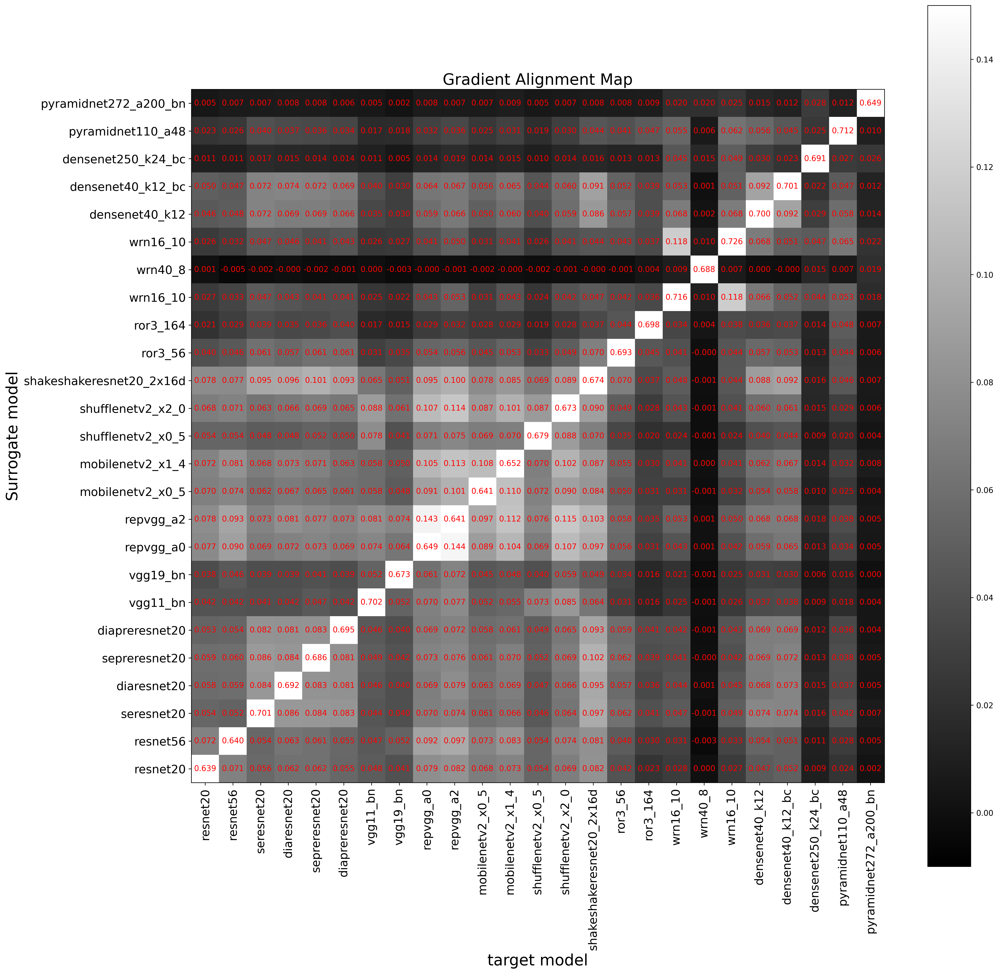

In [220]:
plotMyHeatMap(gradient_alignment_map, [x[1] for x in all_model_map], "Gradient Alignment Map", True)

### plot Accuracy Heatmap

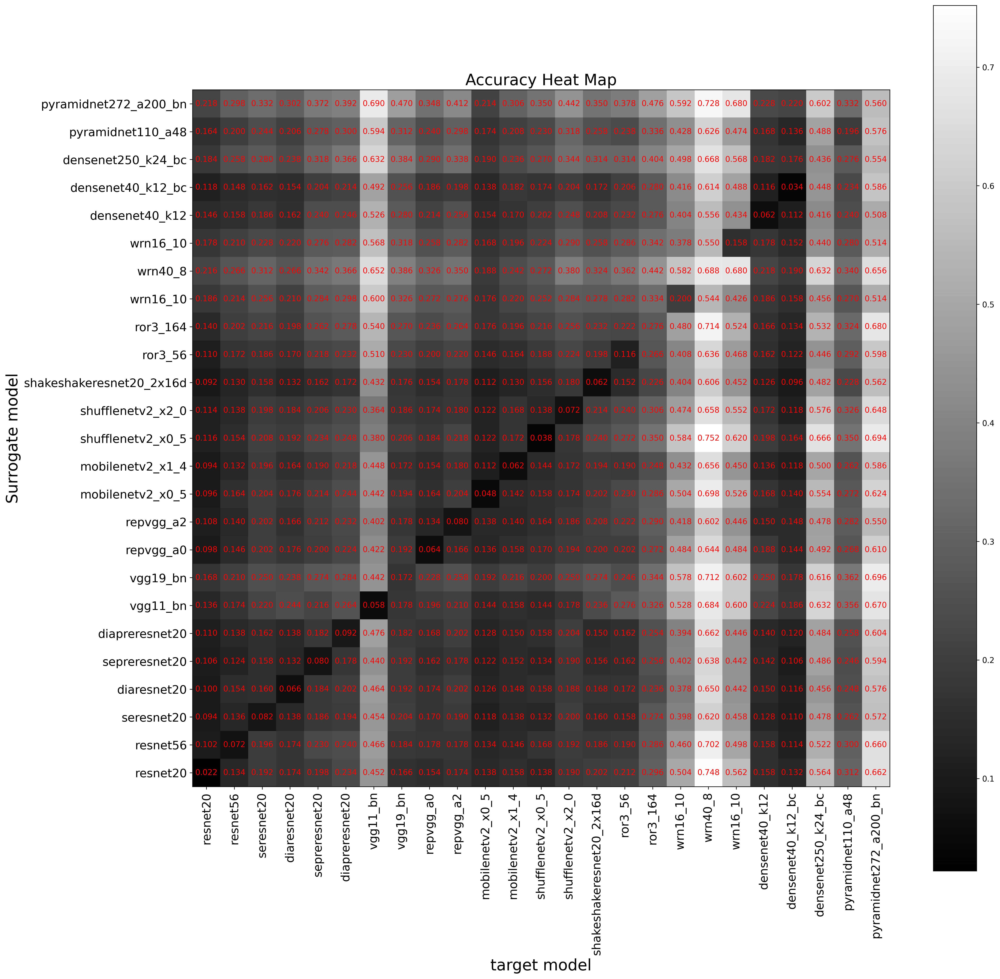

In [219]:
plotMyHeatMap(accuracy_map, [x[1] for x in all_model_map], "Accuracy Heat Map")


##### function for plotting line

In [14]:
def plotMyLine(model_names, data, title, label, xlabel="", marker=".", need_legend=False):
    formatdict = {"size":15}
    length = len(data)
    
    plt.plot(data, label=label, marker=marker)
    plt.title(title, fontdict=formatdict)
    plt.xticks(range(length), model_names, rotation=90)
    plt.xlabel(xlabel, fontdict=formatdict)
    if need_legend:
        plt.legend(bbox_to_anchor=(0.25, 1))

##### claculate average accuracy by accuracy_map we've construct above

In [15]:
model_names =[x[1] for x in all_model_map]
# gradient_size = [torch.mean(torch.linalg.vector_norm(fgsm_model.grad,dim=1)).cpu().item()  for fgsm_model, _ in all_fgsm_map]
# avg_atk_acc = [np.mean(x) for x in accuracy_map]

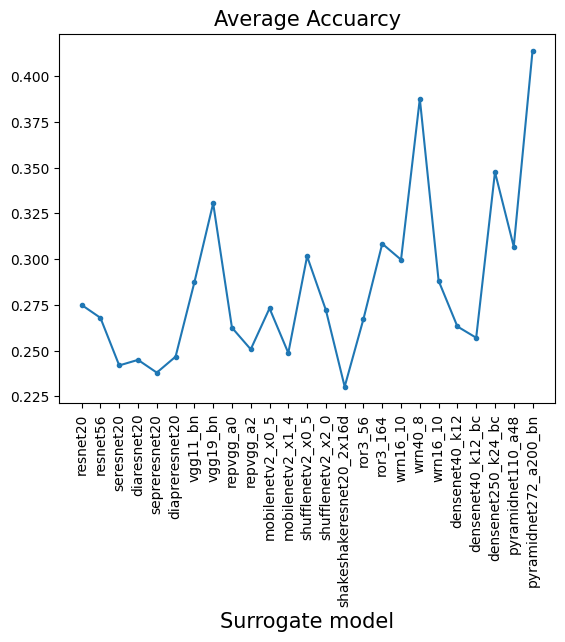

In [34]:
plotMyLine(model_names,avg_atk_acc, "Average Accuarcy", "", "Surrogate model")

### sort model by accuracy

In [35]:
model_list = [model for model, _ in all_model_map]

topKmodel = [model.cuda() for acc, model in  sorted(list(zip(avg_atk_acc,model_list)), key=lambda x : x[0])]

### use model having top 10 lowest accuracy for ensemble FGSM attack

In [36]:
multi_fgsm_model = myFGSM(topKmodel[:10]) 
multi_fgsm_ADX = myAttack(multi_fgsm_model, images, labels) # about 1 minute on RTX3080

Failed to set device automatically, please try set_device() manual.
Attack mode is changed to 'default.'


In [37]:
acc_of_multi_fgsm_ADX = [calculateACC(model.cuda(), multi_fgsm_ADX, labels)[0] for model, model_name in all_model_map]

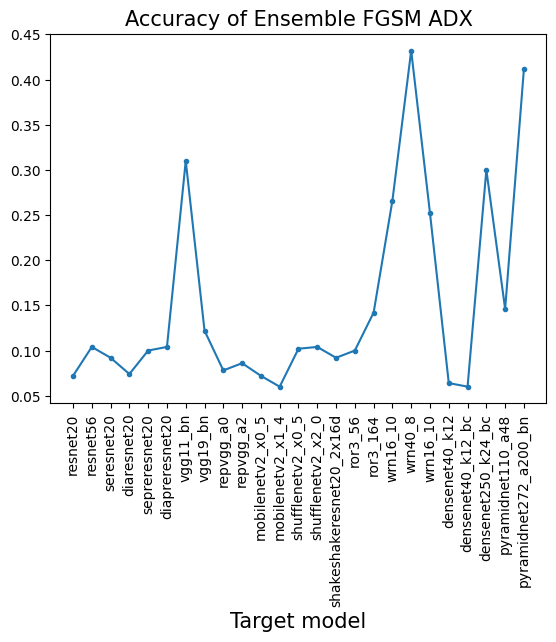

In [38]:
plotMyLine(model_names, acc_of_multi_fgsm_ADX, "Accuracy of Ensemble FGSM ADX","", "Target model")

### use wrn40_8 as surrogate model to generate ADX

In [16]:
torch.manual_seed(48763)
wrn40_8_PGD_model = myPGD([wrn40_8.cuda()], eps = 8 /255, steps=10)
wrn40_8_PGD_ADX = myAttack(wrn40_8_PGD_model, images, labels) # It takes about a minute

Failed to set device automatically, please try set_device() manual.
Attack mode is changed to 'default.'


In [16]:
temp = images.clone()
temp.shape

torch.Size([500, 3, 32, 32])

In [22]:
acc_of_wrn40_8_PGD_ADX = [calculateACC(model.cuda(), images, labels)[0] for model, model_name in all_model_map]
print(np.average(acc_of_wrn40_8_PGD_ADX))


0.8776


In [17]:
acc_of_wrn40_8_PGD_ADX = [calculateACC(model.cuda(), wrn40_8_PGD_ADX, labels)[0] for model, model_name in all_model_map]
print(np.average(acc_of_wrn40_8_PGD_ADX))


0.44303999999999993


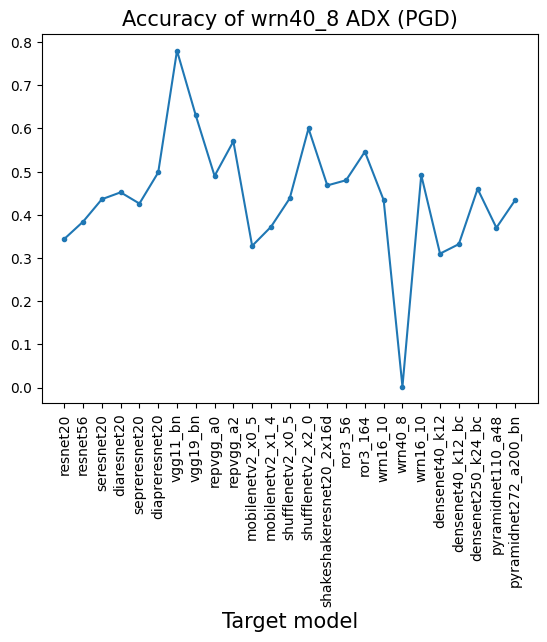

In [18]:
plotMyLine(model_names, acc_of_wrn40_8_PGD_ADX, "Accuracy of wrn40_8 ADX (PGD)","", "Target model")

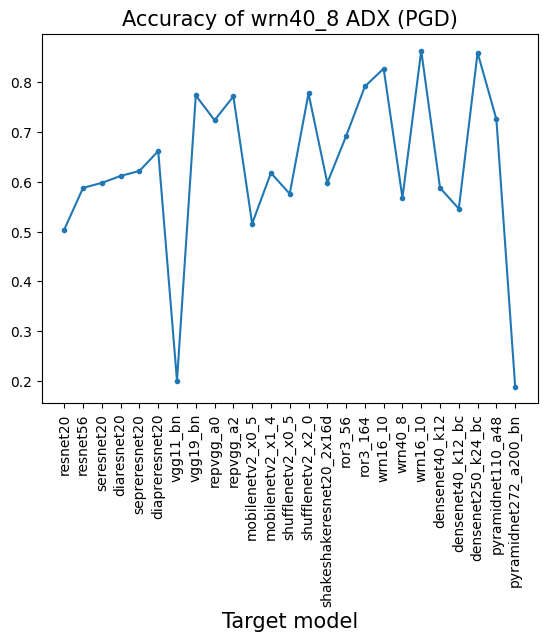

In [37]:
plotMyLine(model_names, acc_of_wrn40_8_PGD_ADX, "Accuracy of wrn40_8 ADX (PGD)","", "Target model")

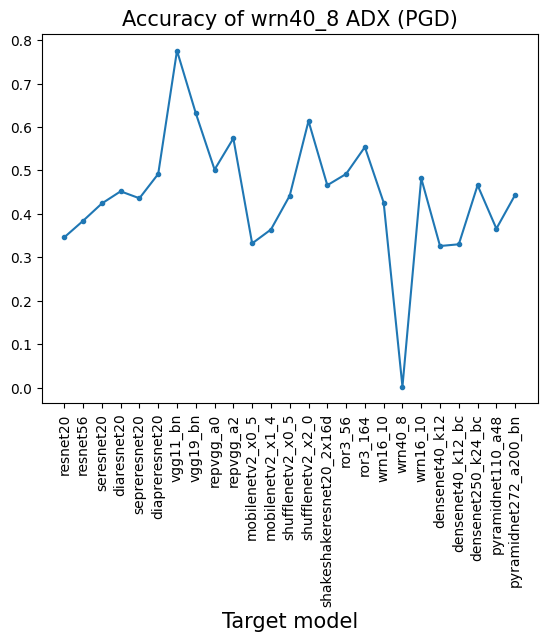

In [90]:
plotMyLine(model_names, acc_of_wrn40_8_PGD_ADX, "Accuracy of wrn40_8 ADX (PGD)","", "Target model")

### use wrn40_8 and pyramidnet272_a200_bn as surrogate model to generate ADX

In [44]:
multi_PGD_model = myPGD([wrn40_8.cuda(), pyramidnet272_a200_bn.cuda()], eps = 8 /255, steps=10)
multi_PGD_ADX = myAttack(multi_PGD_model, images, labels)
print("Done") # It takes 8.5 minutes
acc_of_multi_PGD_ADX = [calculateACC(model.cuda(), multi_PGD_ADX, labels)[0] for model, model_name in all_model_map]


Failed to set device automatically, please try set_device() manual.
Attack mode is changed to 'default.'
Done


0.36727999999999994


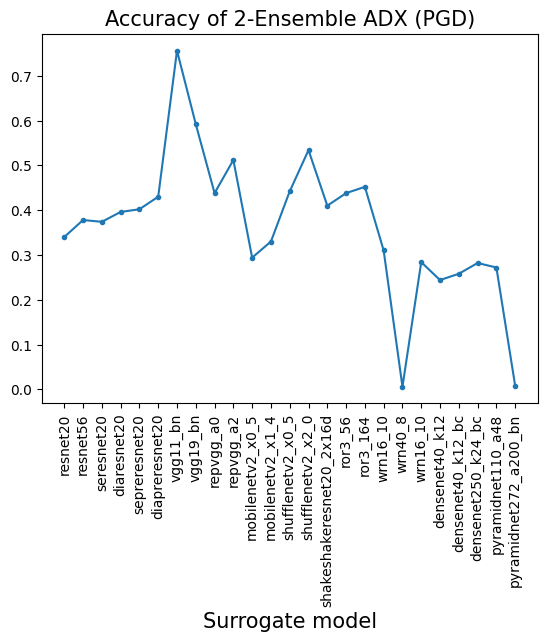

In [48]:
print(np.average(acc_of_multi_PGD_ADX))
plotMyLine(model_names, acc_of_multi_PGD_ADX, "Accuracy of 2-Ensemble ADX (PGD)","", "Surrogate model")

### use wrn40_8, pyramidnet272_a200_bn and vgg11_bn as surrogate model to generate ADX

In [15]:
torch.manual_seed(48763)
multi_2_PGD_model = myPGD([wrn40_8.cuda(), pyramidnet272_a200_bn.cuda(), vgg11_bn.cuda()], eps = 8 /255, steps=10)
multi_2_PGD_ADX = myAttack(multi_2_PGD_model, images, labels)
print("Done") # It takes 8.5 minutes
acc_of_multi_2_PGD_ADX = [calculateACC(model.cuda(), multi_2_PGD_ADX, labels)[0] for model, model_name in all_model_map]


Failed to set device automatically, please try set_device() manual.
Attack mode is changed to 'default.'
Done


In [21]:
images.shape

torch.Size([500, 3, 32, 32])

0.5355200000000001


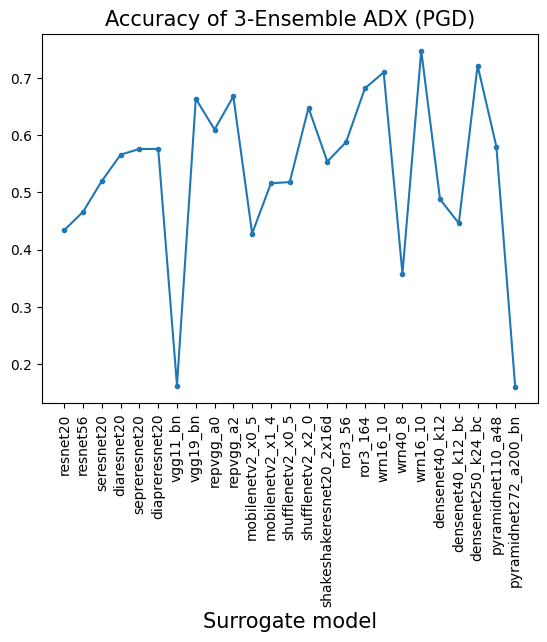

In [18]:
print(np.average(acc_of_multi_2_PGD_ADX))
plotMyLine(model_names, acc_of_multi_2_PGD_ADX, "Accuracy of 3-Ensemble ADX (PGD)","", "Surrogate model")

0.14376


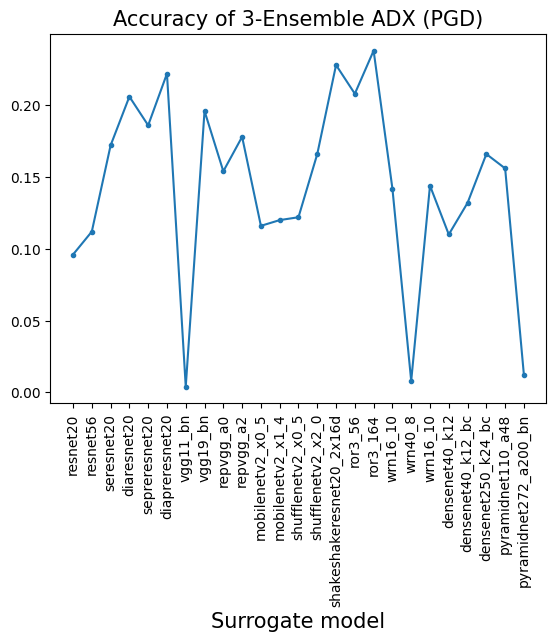

In [94]:
print(np.average(acc_of_multi_2_PGD_ADX))
plotMyLine(model_names, acc_of_multi_2_PGD_ADX, "Accuracy of 3-Ensemble ADX (PGD)","", "Surrogate model")

##### the apple before and after Ensemble PGD attack

In [ ]:
apple_multi_PGD = denormalize(multi_2_PGD_ADX.cpu().numpy())
myPicturePlotting(1,2,[imgDeChangeAxis(apple_multi_PGD[0]), imgDeChangeAxis(img_data_list[0])])

##### other function for fun

In [29]:
def getPredict(model, image, label_names):
    with torch.no_grad():
        model.eval()
        pred = model(image.reshape(1,3,32,32))
        pred_id = torch.argmax(pred).item()
    
    torch.cuda.empty_cache()
    return label_names[pred_id]

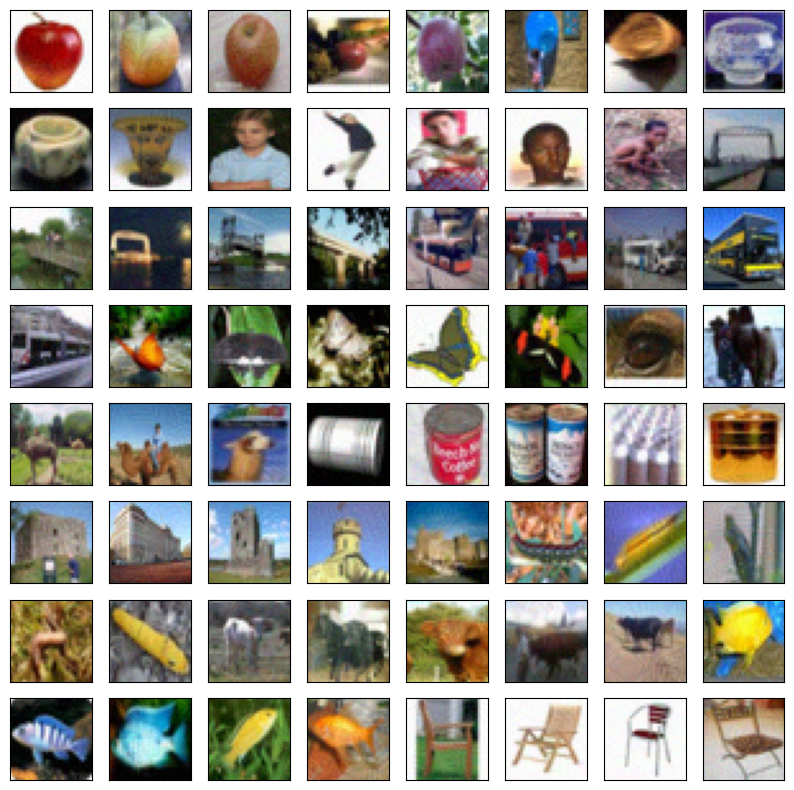

In [27]:

myPicturePlotting(8,8, denormalize(imgDeChangeAxis(multi_2_PGD_ADX.cpu().numpy())[:64]))

##### to simply see how many wrong answer pyramidnet272_a200_bn have

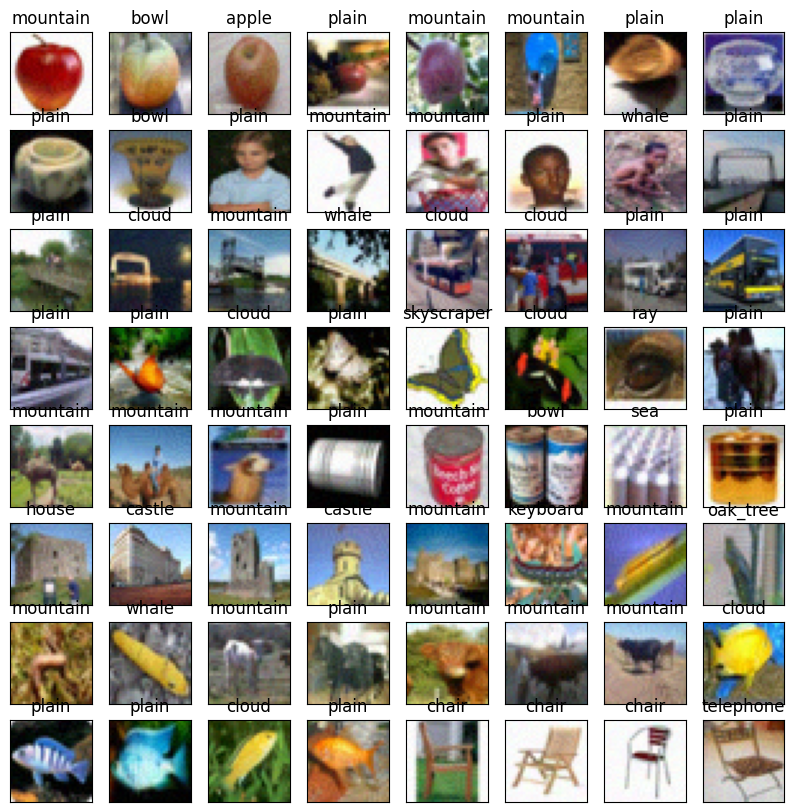

In [31]:
pred_name = [getPredict(pyramidnet272_a200_bn.cuda(), adx, label_names) for adx in multi_2_PGD_ADX[:64]]
myPicturePlotting(8,8, denormalize(imgDeChangeAxis(multi_2_PGD_ADX.cpu().numpy())[:64]), pred_name)

##### below are true labels

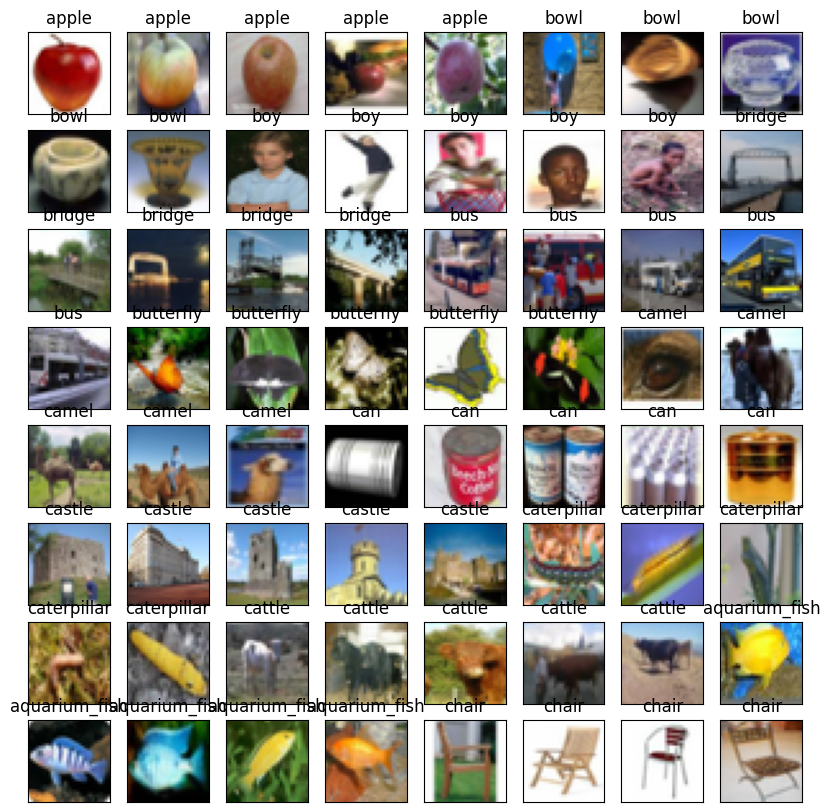

In [169]:
myPicturePlotting(8,8, imgDeChangeAxis(np.stack(img_data_list))[:64], [label_names[idx] for idx in img_label_list[:64]])

### Aggregate the plots above together

In [ ]:
origin_acc = [calculateACC(model.cuda(), images, labels)[0] for model, _ in all_model_map]

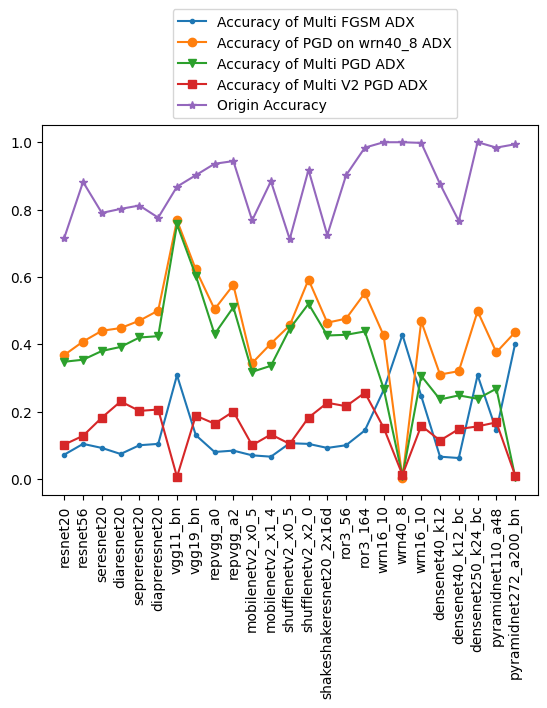

In [242]:
plotMyLine(model_names, acc_of_multi_fgsm_ADX,"", "Accuracy of Multi FGSM ADX", "", ".")
plotMyLine(model_names, acc_of_wrn40_8_PGD_ADX,"", "Accuracy of PGD on wrn40_8 ADX", "", "o")
plotMyLine(model_names, acc_of_multi_PGD_ADX,"", "Accuracy of Multi PGD ADX", "", "v")
plotMyLine(model_names, acc_of_multi_2_PGD_ADX,"", "Accuracy of Multi V2 PGD ADX", "", "s")
plotMyLine(model_names, origin_acc, "", "Origin Accuracy", "", "*")

### output the ADX

In [104]:
final_output_ADX = denormalize(imgDeChangeAxis(multi_2_PGD_ADX.cpu().numpy()))
final_output_ADX.shape

(500, 32, 32, 3)

In [108]:
# img_name_list
for idx in range(final_output_ADX.shape[0]):
    path = f"Adversarial Examples2/{img_name_list[idx]}"
    adx = Image.fromarray(final_output_ADX[idx])
    adx.save(path)

### Below is a tesing of  output ADX

In [10]:

ADX_list = []
ADX_label_list = []

for name in os.listdir("./Adversarial Examples2"):
    path = f"Adversarial Examples2/{name}"
    label = int(name.split("_")[0])
    img = imgChangeAxis(np.array(Image.open(path))) 
    ADX_list.append(img)
    ADX_label_list.append(label)
print(ADX_list[0].shape)

(3, 32, 32)


In [11]:
device = 'cuda'
adx_images = normalize(torch.tensor(np.stack(ADX_list))).to(torch.float32) # but I still use my normalize function :)
adx_images = adx_images.to(device)

adx_labels = torch.tensor(np.stack(ADX_label_list)).to(torch.int64)
adx_labels = adx_labels.to(device)

In [12]:
acc_of_ADX = [calculateACC(model.cuda(), adx_images, adx_labels)[0] for model, model_name in all_model_map]

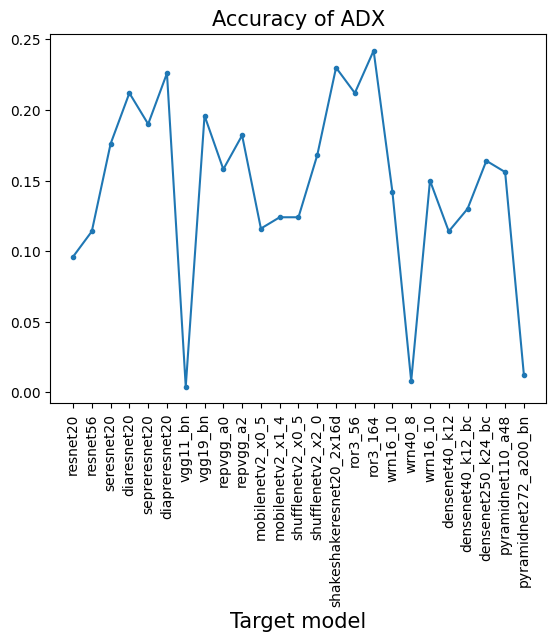

In [13]:
plotMyLine(model_names, acc_of_ADX, "Accuracy of ADX","", "Target model")